In [1]:
import matplotlib.pyplot as plt


def plot_images_from_array(array, path):

    fig, axes = plt.subplots(3, 6, figsize=(15, 8))
    axes = axes.flatten()

    for i in range(min(18, array.shape[0])):
        img_array = array[i]  # shape (3, 32, 64)
        img_array = np.transpose(img_array, (1, 2, 0))  # shape (32, 64, 3)
        # img_array = np.clip(img_array, 0, 255).astype(np.uint8)

        axes[i].imshow(img_array)
        axes[i].axis("off")
        axes[i].set_title(f"Image {i+1}")

    plt.tight_layout()
    plt.savefig(path)

In [2]:
def s3_save_numpy(array, bucket_name, key):
    byte_stream = io.BytesIO()
    np.save(byte_stream, array, allow_pickle=False)
    byte_stream.seek(0)
    s3.upload_fileobj(byte_stream, bucket_name, key)


def s3_load_numpy(bucket_name, file_key):
    response = s3.get_object(Bucket=bucket_name, Key=file_key)
    data = response["Body"].read()
    return np.load(io.BytesIO(data))

In [3]:
import numpy as np
import cv2
import os


def save_image_grid(batch, filename, grid_rows=3, grid_cols=6, scale_factor=5):
    """Save a batch of images as a grid using OpenCV"""
    # Convert to numpy and ensure proper type
    array = np.asarray(batch, dtype=np.float32)

    # Get dimensions
    batch_size, height, width, channels = array.shape

    # Calculate enlarged dimensions
    enlarged_width = width * scale_factor
    enlarged_height = height * scale_factor

    # Create a blank image for the grid
    grid_width = grid_cols * enlarged_width
    grid_height = grid_rows * enlarged_height

    if channels == 1:
        grid_image = np.ones((grid_height, grid_width), dtype=np.float32)
    else:  # Assume RGB
        grid_image = np.ones((grid_height, grid_width, channels), dtype=np.float32)

    # Add each image to the grid
    for i in range(min(batch_size, grid_rows * grid_cols)):
        row = i // grid_cols
        col = i % grid_cols

        # Get the image data and make sure it's a proper numpy array
        img_data = np.asarray(array[i], dtype=np.float32)

        # OpenCV expects images in specific format
        if channels == 1:
            if len(img_data.shape) == 3 and img_data.shape[2] == 1:
                img_data = img_data.squeeze(2)  # Remove single channel dimension

        # Resize the image (make sure it's a proper numpy array of the right format)
        img_enlarged = cv2.resize(
            img_data,
            dsize=(enlarged_width, enlarged_height),
            interpolation=cv2.INTER_NEAREST,
        )

        # Place in grid
        y_start = row * enlarged_height
        y_end = (row + 1) * enlarged_height
        x_start = col * enlarged_width
        x_end = (col + 1) * enlarged_width

        if channels == 1:
            grid_image[y_start:y_end, x_start:x_end] = img_enlarged
        else:
            grid_image[y_start:y_end, x_start:x_end, :] = img_enlarged

    # Normalize to 0-1 range
    grid_image = (grid_image - np.min(grid_image)) / (
        np.max(grid_image) - np.min(grid_image) + 1e-8
    )

    # Convert to uint8 (0-255)
    grid_image = (grid_image * 255).astype(np.uint8)

    # Make sure the directory exists
    os.makedirs(
        os.path.dirname(filename) if os.path.dirname(filename) else ".", exist_ok=True
    )

    # Save the grid
    cv2.imwrite(filename, grid_image)
    print(f"Saved enlarged grid to {filename}")

70
70


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9137255..0.66274524].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9764706..0.7882354].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.7176472].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.72549033].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.7176472].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9607843..0.73333347].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.92156863..0.764706].


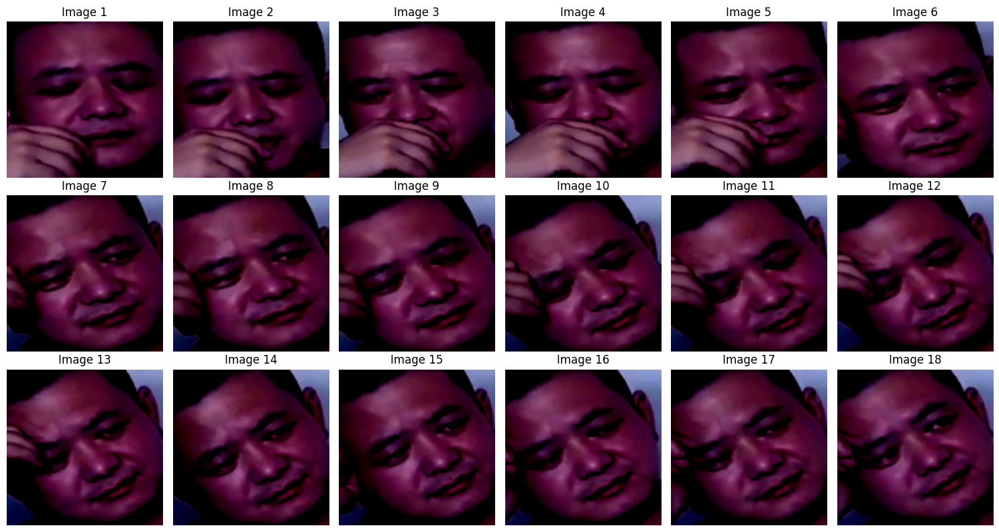

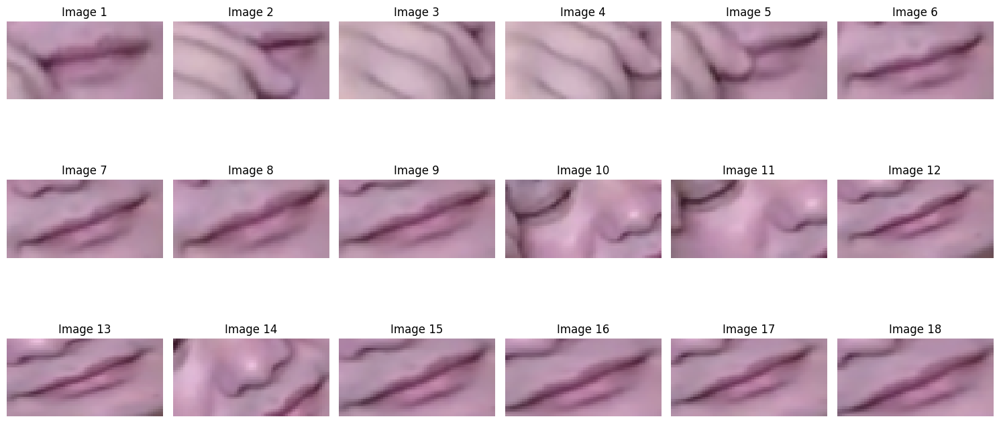

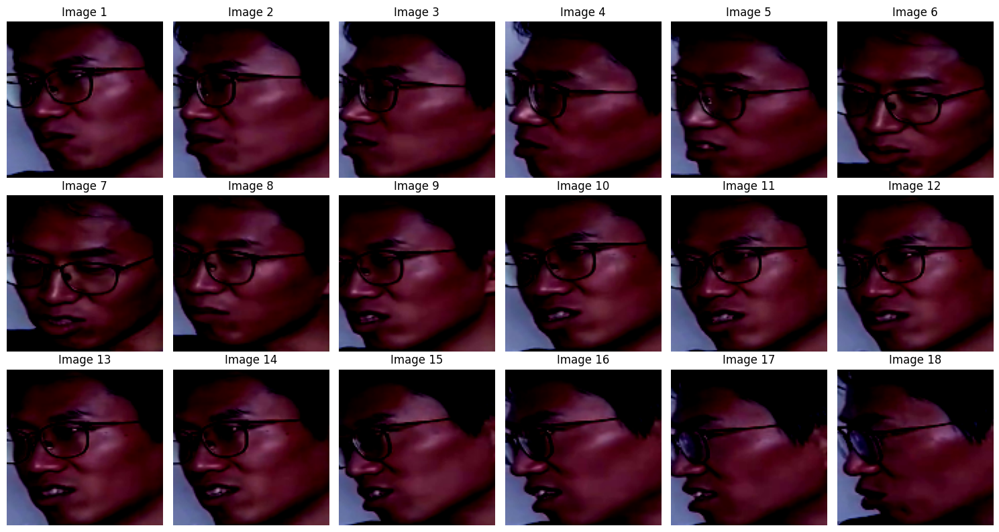

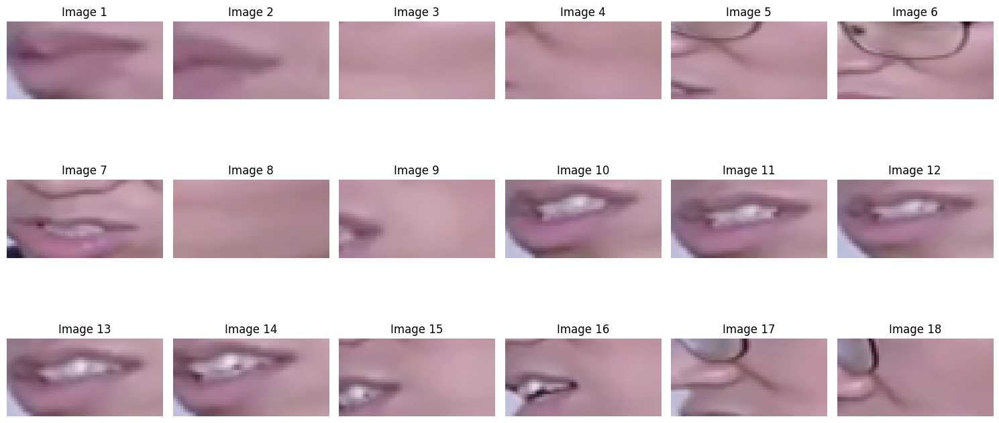

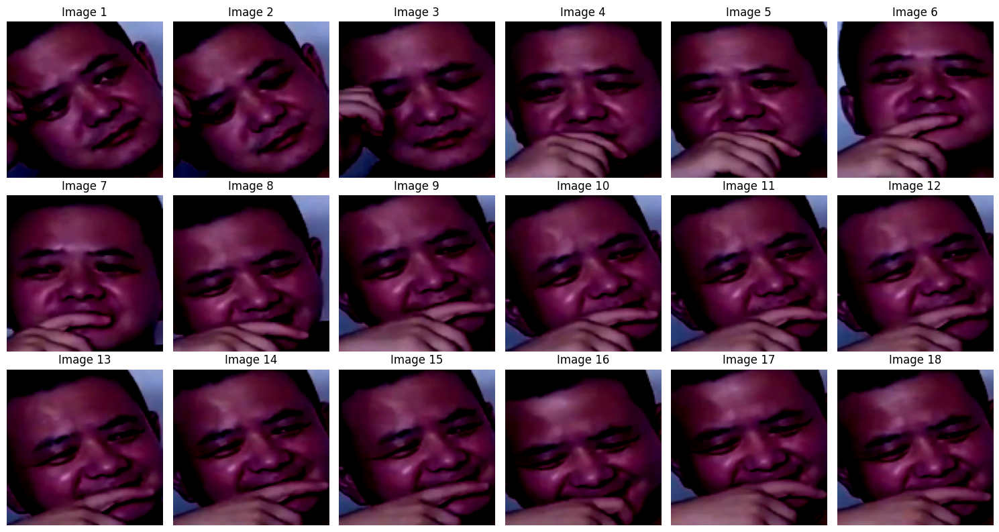

...

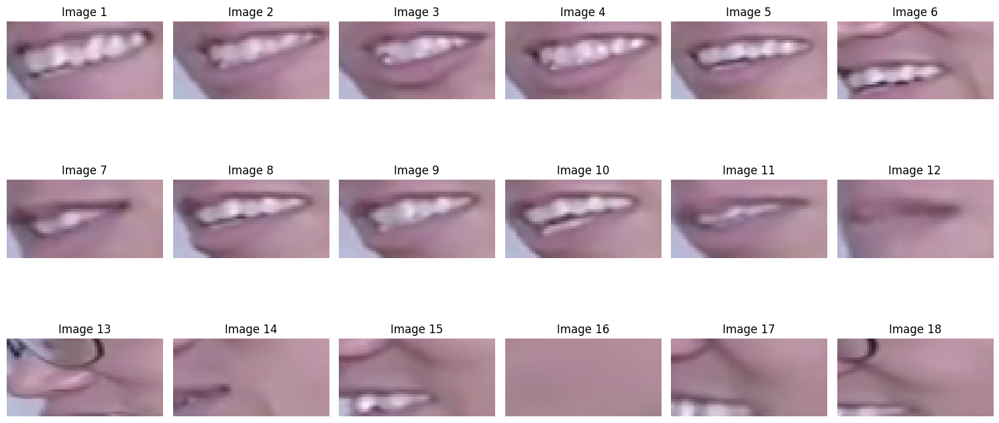

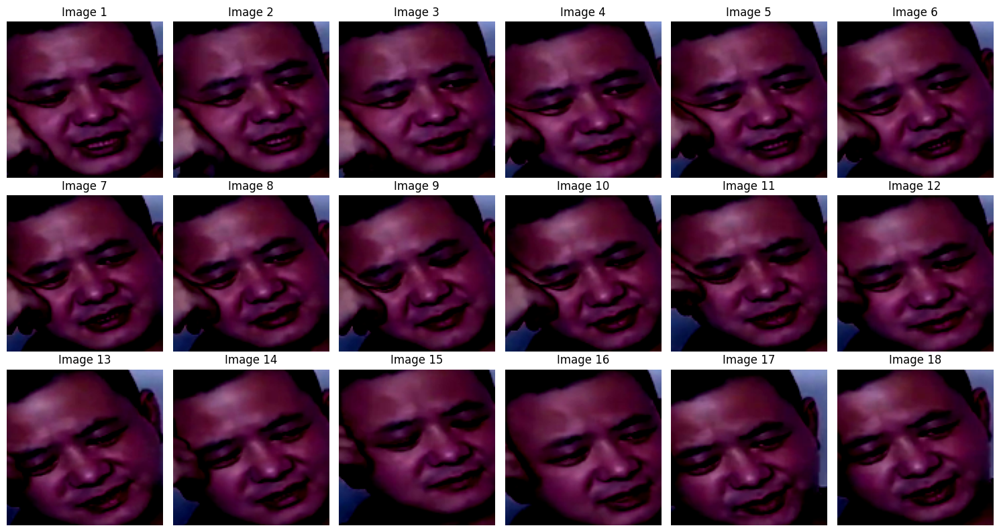

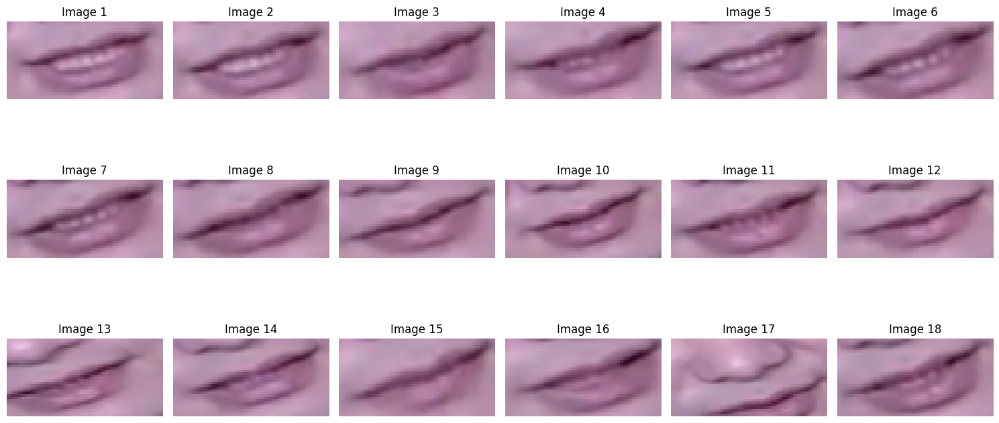

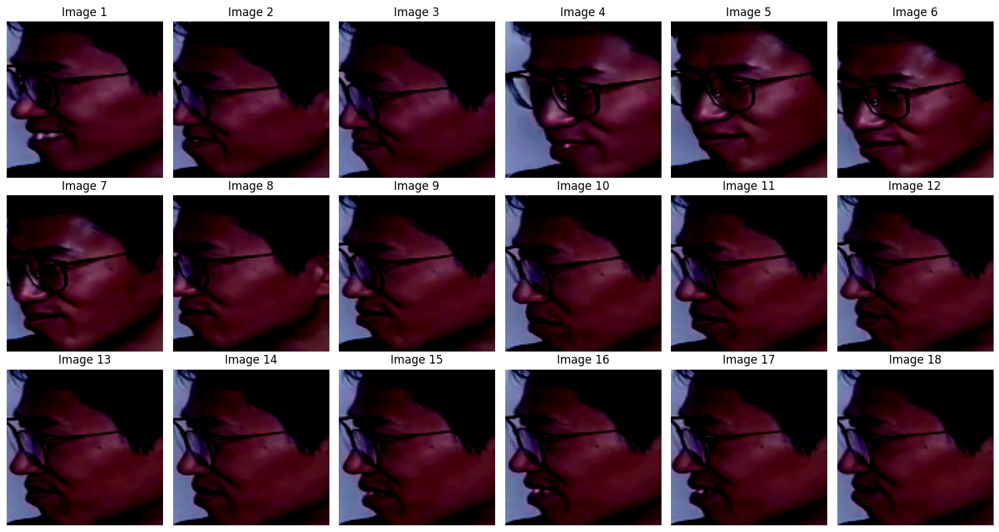

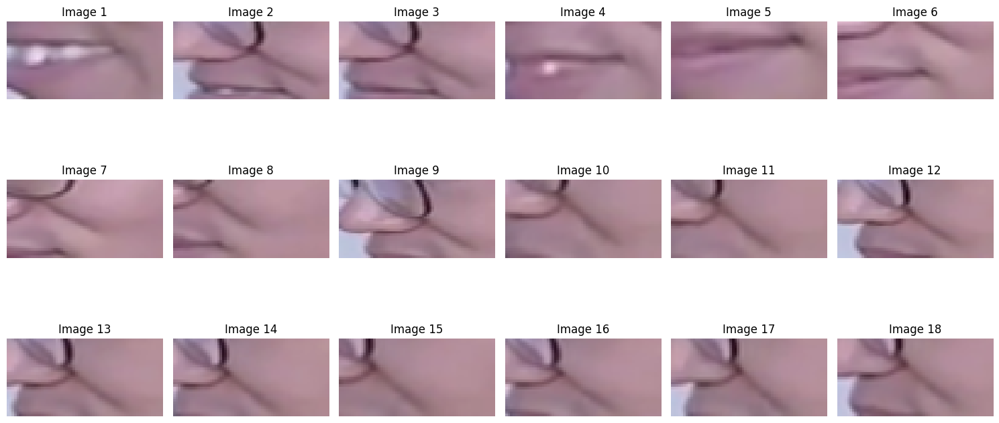

In [8]:
import os
import boto3
import numpy as np
import io
import cv2

# Initialize S3 client
s3 = boto3.client("s3")

bucket_name = "mmml-proj"
prefix = "preprocessed_2/00007/"  # Optional. Set to '' if you want the whole bucket.

# Paginate through objects in the bucket/prefix
paginator = s3.get_paginator("list_objects_v2")
pages = paginator.paginate(Bucket=bucket_name, Prefix=prefix)

# Collect keys that contain 'face_'
face_keys = []

for page in pages:
    if "Contents" in page:
        for obj in page["Contents"]:
            key = obj["Key"]
            if "face_" in key:
                face_keys.append(key)

lip_keys = []
for page in pages:
    if "Contents" in page:
        for obj in page["Contents"]:
            key = obj["Key"]
            if "lip_" in key:
                lip_keys.append(key)

print(len(face_keys))
print(len(lip_keys))

face_keys = face_keys[:10]
lip_keys = lip_keys[:15]

for i, face_key in enumerate(face_keys):
    face_batch = s3_load_numpy(bucket_name, face_key)
    plot_images_from_array(face_batch, f"face_{i}.png")
    lip_batch = s3_load_numpy(bucket_name, lip_keys[i])
    plot_images_from_array(lip_batch, f"lip_{i}.png")